In [ ]:
!pip install split-folders
import splitfolders ## train, test and valid
import os ## operating system
import cv2  ## launch dataset to python
from tensorflow.keras.preprocessing import image_dataset_from_directory ## preprocessing
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt ## visualization
import tensorflow as tf ## deep learning
import numpy as np ## array
from sklearn.metrics import classification_report, confusion_matrix ## checking the performance of the model
import seaborn as sns ## visualization (ability to provide different colors)
import random ## reduce biasness


from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense ## architectures
from tensorflow.keras.applications import ResNet50



In [ ]:
from google.colab import drive ## so as to be ability to access the dataset from google drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
loc='/content/drive/MyDrive/AutismDataset/consolidated'

In [ ]:
os.makedirs('output', exist_ok=True)
os.makedirs('output/train', exist_ok=True)
os.makedirs('output/val', exist_ok=True)
os.makedirs('output/test', exist_ok=True)
splitfolders.ratio(loc,output = "output",seed = 42,ratio = (0.80,.1,.1))

Copying files: 2940 files [02:10, 22.54 files/s] 


In [ ]:
len(os.listdir('/content/output/train/Autistic')),len(os.listdir('/content/output/train/Non_Autistic'))

(1176, 1176)

In [ ]:
train_dir="/content/output/train"
test_dir="/content/output/test"
val_dir="/content/output/val"
train_data=image_dataset_from_directory(train_dir,batch_size=32,image_size=(224,224),label_mode='categorical',shuffle=True,seed=42)
test_data=image_dataset_from_directory(test_dir,batch_size=32,image_size=(224,224),label_mode='categorical',shuffle=False,seed=42)
val_data=image_dataset_from_directory(val_dir,batch_size=32,image_size=(224,224),label_mode='categorical',shuffle=False,seed=42)

Found 2352 files belonging to 2 classes.
Found 294 files belonging to 2 classes.
Found 294 files belonging to 2 classes.


In [ ]:
class_names=train_data.class_names
class_count=len(class_names)
samples = []
x = 0
for i in tqdm(train_data.unbatch()):
    if (x == 10):
        break
    samples.append([i[0], i[1]])
    x += 1

images = []
labels = []
for i in samples:
    images.append(i[0])
    labels.append(class_names[tf.argmax(i[1])])
len(images), len(labels)

0it [00:00, ?it/s]

(10, 10)

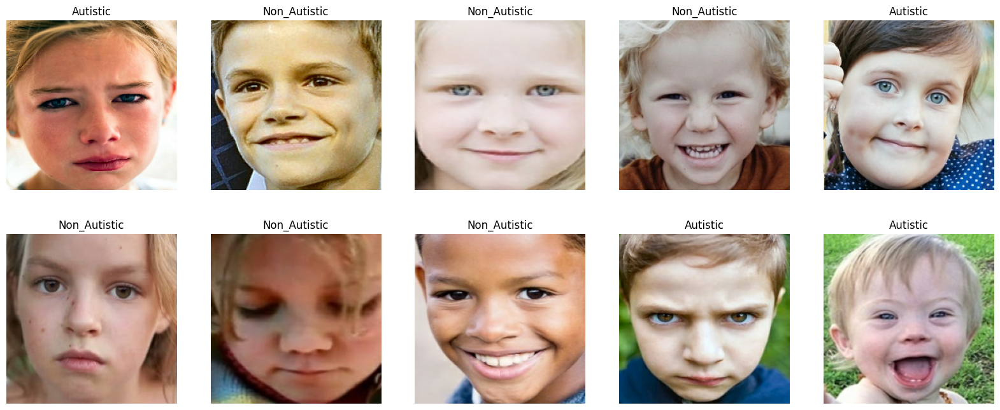

In [ ]:
fig = plt.figure(figsize=(20, 8))
rows = 2
cols = 5
x = 1
for image, label in zip(images, labels):
    fig.add_subplot(rows, cols, x)
    plt.imshow(image/255.)
    plt.axis("off")
    plt.title(label)
    x += 1

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

## CNN model

In [ ]:


# Define the model
model = Sequential([
    Conv2D(16, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(class_count, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_data, validation_data=val_data, epochs=10)


Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


74/74 ━━━━━━━━━━━━━━━━━━━━ 116s 2s/step - accuracy: 0.5153 - loss: 96.6894 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - accuracy: 0.5051 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 147s 2s/step - accuracy: 0.5055 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - accuracy: 0.5024 - loss: 0.6931 - val_accuracy: 0.5000 - val_loss: 0.6932
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 141s 1s/step - accuracy: 0.4923 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 148s 2s/step - accuracy: 0.5000 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 111s 2s/step - accuracy: 0.4904 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0.6931
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.4958 - loss: 0.6932 - val_accuracy: 0.5000 - val_loss: 0

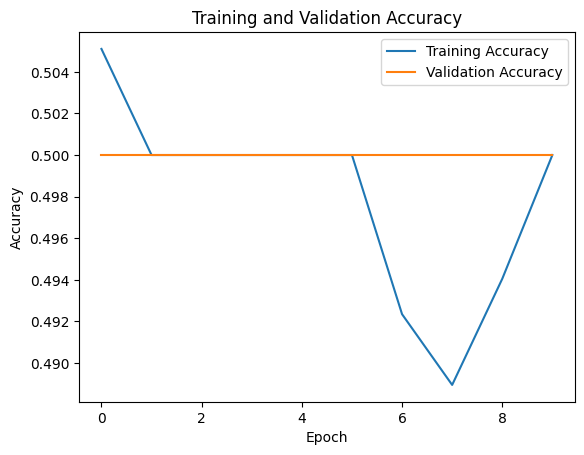

In [ ]:
# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

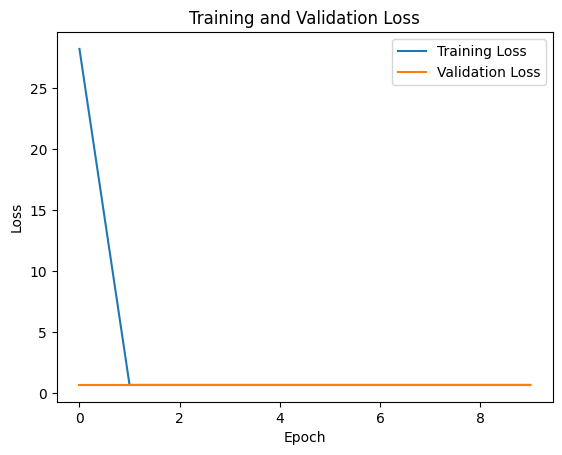

In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 419ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 448ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 415ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
Classification Report:
              precision    recall  f1-score   support

Non-Autistic       0.50      1.00      0.67       147
    Autistic       0.00      0.00      0.00       147

    accuracy                           0.50       294
   macro avg       0.25      0.50      0.33       294
weighted avg       0.25      0.50      0.33       294



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


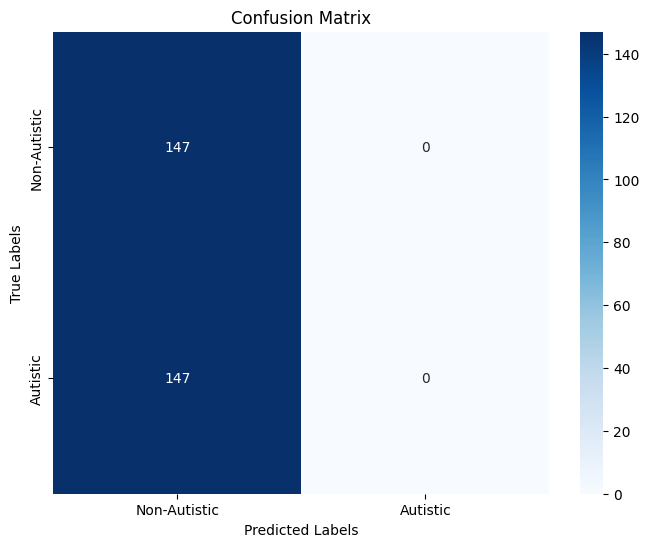

In [ ]:



# Define class labels for your dataset
class_labels = ["Non-Autistic", "Autistic"]

# Step 1: Get the true labels and predicted labels from the test dataset
# The test data is already loaded in `test_data`
test_labels = []
test_predictions = []

# Iterate over the test data to collect true labels and predictions
for images, labels in test_data:
    # Append true labels
    test_labels.extend(np.argmax(labels, axis=1))

    # Predict class probabilities and take the class with the highest probability
    preds = model.predict(images)
    test_predictions.extend(np.argmax(preds, axis=1))

# Convert the lists to numpy arrays for further processing
test_labels = np.array(test_labels)
test_predictions = np.array(test_predictions)

# Step 2: Generate the classification report
print("Classification Report:")
print(classification_report(test_labels, test_predictions, target_names=class_labels))

# Step 3: Generate the confusion matrix
conf_matrix = confusion_matrix(test_labels, test_predictions)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
Image Descriptions:


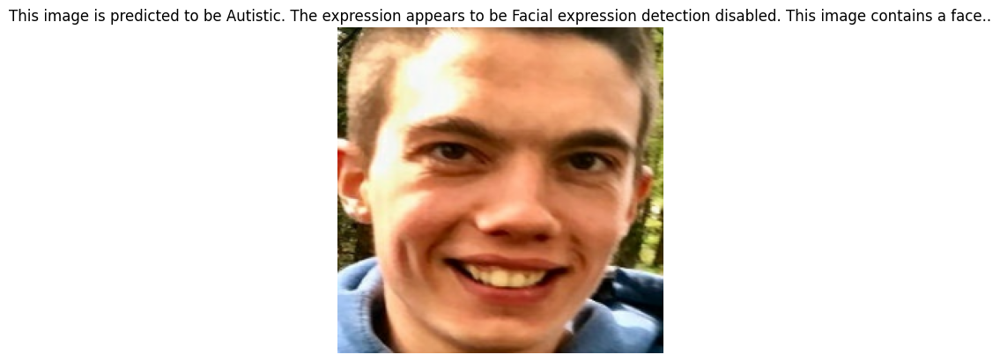

Image 1:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



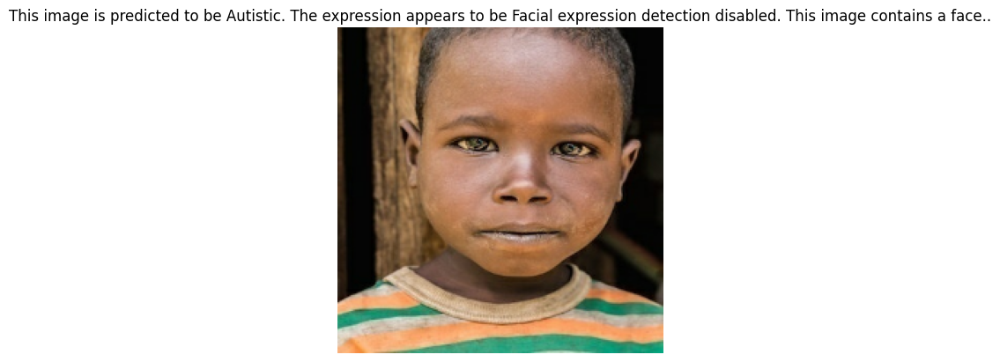

Image 2:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



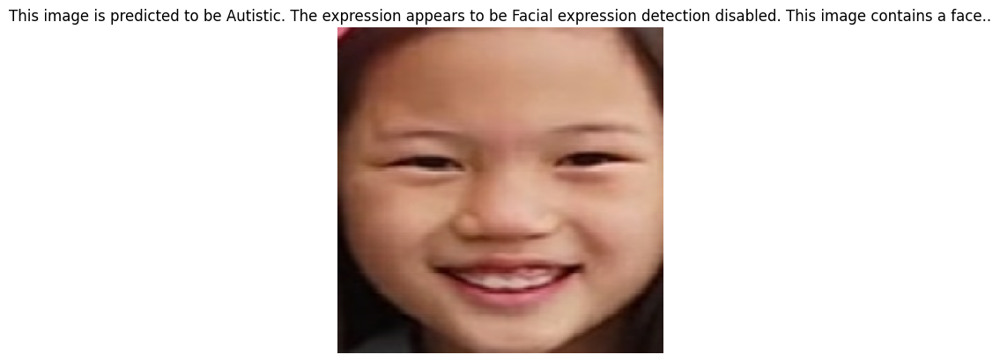

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



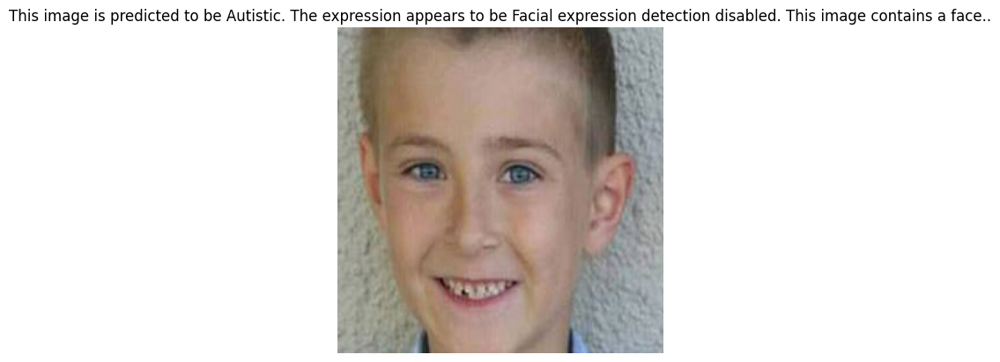

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



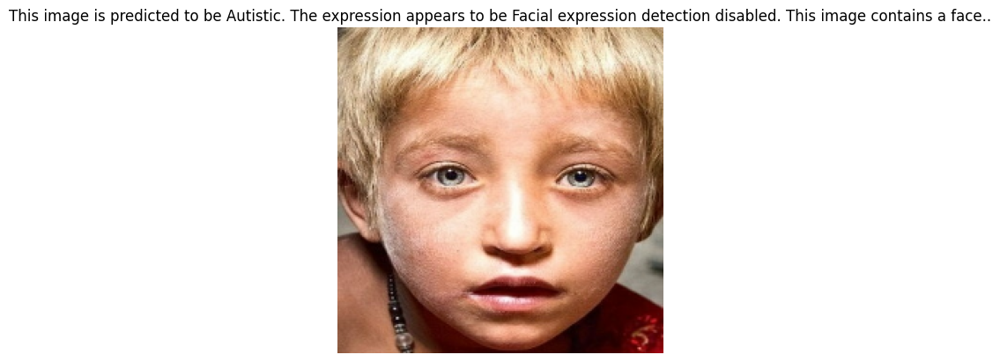

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Image Descriptions:


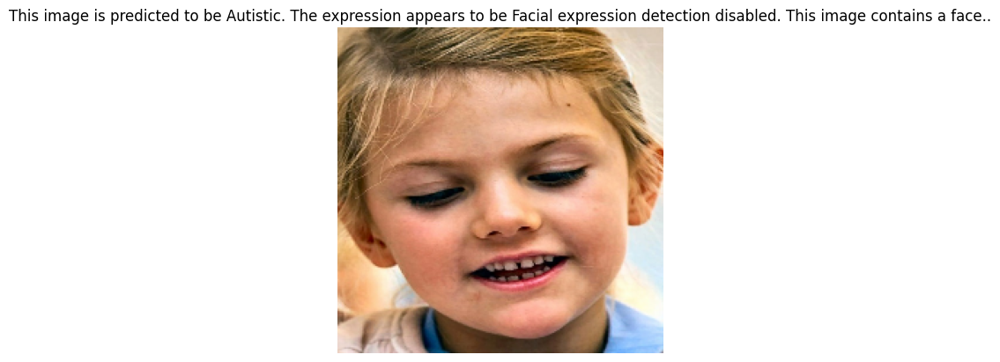

Image 1:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



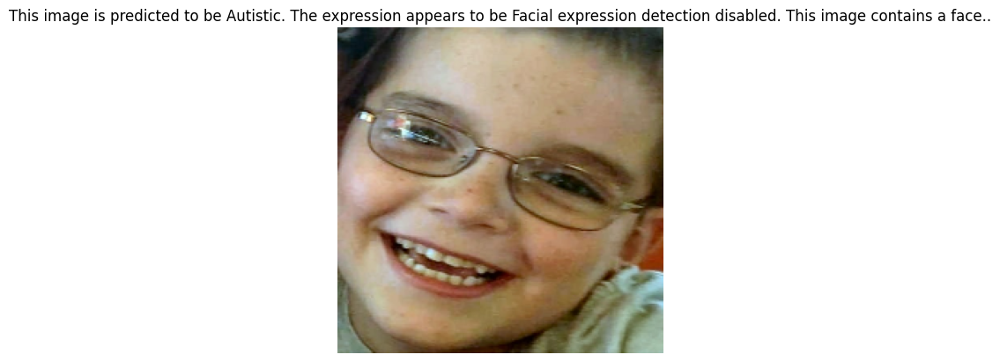

Image 2:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



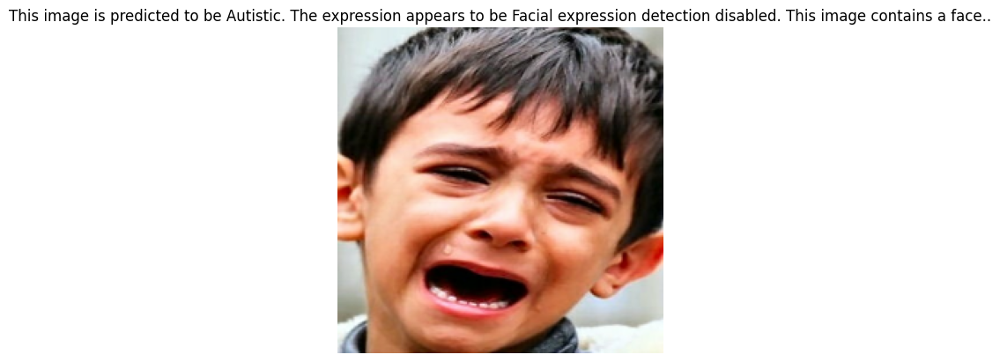

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



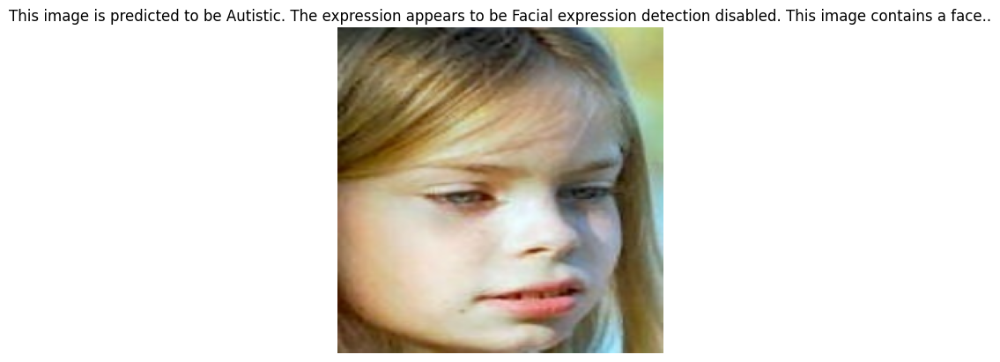

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



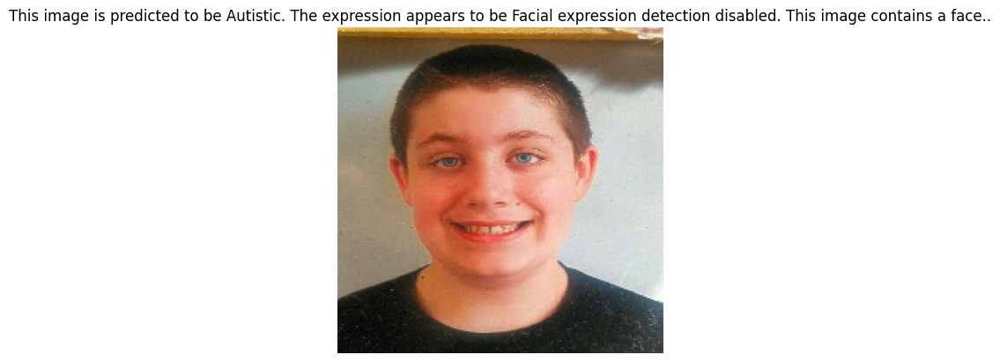

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

Overall Accuracy: 0.5
The overall accuracy is 50.00%.


In [ ]:


# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the image
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()

# Calculate overall accuracy
overall_accuracy = correct_predictions / (num_images * len(image_batch))
print("Overall Accuracy:", overall_accuracy)
print(f"The overall accuracy is {overall_accuracy:.2%}.")




## mobile net v2

In [ ]:


# Load the pre-trained MobileNetV2 model without the top classification layer
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the pre-trained model
model2= Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(class_count, activation='softmax')
])

# Compile the model
model2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history2 = model2.fit(train_data, validation_data=val_data, epochs=10)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 125s 2s/step - accuracy: 0.6380 - loss: 0.6663 - val_accuracy: 0.7007 - val_loss: 0.5533
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 118s 2s/step - accuracy: 0.7280 - loss: 0.5304 - val_accuracy: 0.6837 - val_loss: 0.6046
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 151s 2s/step - accuracy: 0.7278 - loss: 0.5248 - val_accuracy: 0.6837 - val_loss: 0.5806
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 132s 2s/step - accuracy: 0.7399 - loss: 0.4874 - val_accuracy: 0.6837 - val_loss: 0.6733
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.7584 - loss: 0.4996 - val_accuracy: 0.6871 - val_loss: 0.6039
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step - accuracy: 0.7672 - loss: 0.4707 - val_accuracy: 0.6973 - val_loss: 0.5592
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 159s 2s/step - accuracy: 0.7916 - loss: 0.4315 - val_accuracy: 0.7177 - val_loss: 0.5589
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy:

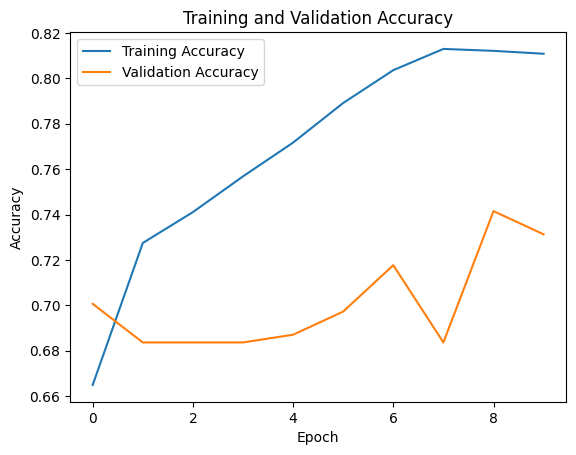

In [ ]:
# Plot training and validation accuracy
plt.plot(history2.history['accuracy'], label='Training Accuracy')
plt.plot(history2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

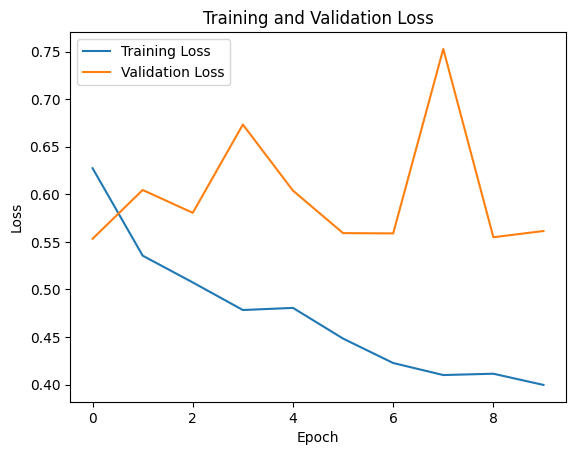

In [ ]:
# Plot training and validation loss
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 291ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

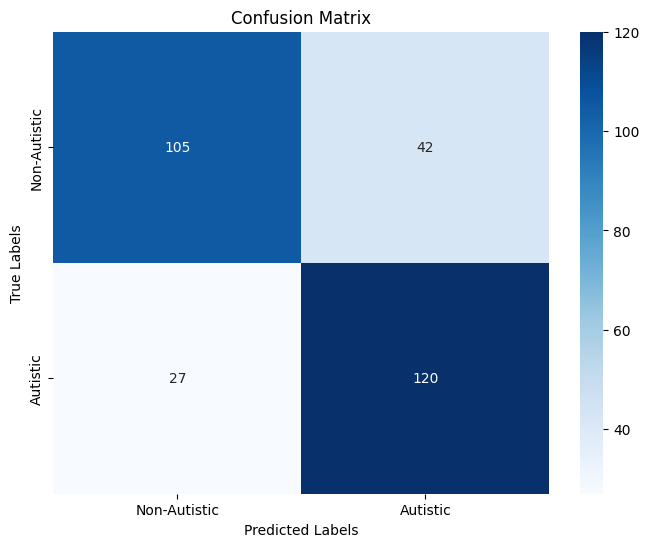

In [ ]:


# Define class labels for your dataset
class_labels = ["Non-Autistic", "Autistic"]

# Step 1: Get the true labels and predicted labels from the test dataset
test_labels = []
test_predictions = []

# Iterate over the test data to collect true labels and predictions
for images, labels in test_data:
    # Append true labels
    test_labels.extend(np.argmax(labels, axis=1))

    # Predict class probabilities and take the class with the highest probability
    preds = model2.predict(images)
    test_predictions.extend(np.argmax(preds, axis=1))

# Convert the lists to numpy arrays for further processing
test_labels = np.array(test_labels)
test_predictions = np.array(test_predictions)

# Step 2: Generate the classification report
print("Classification Report:")
print(classification_report(test_labels, test_predictions, target_names=class_labels))

# Step 3: Generate the confusion matrix
conf_matrix = confusion_matrix(test_labels, test_predictions)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step
Image Descriptions:


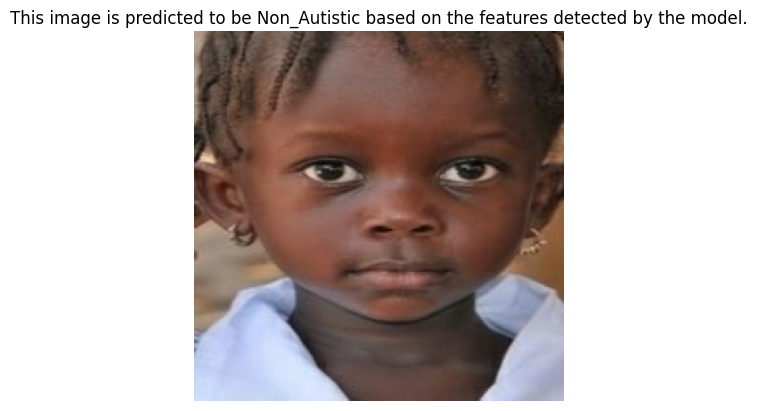

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



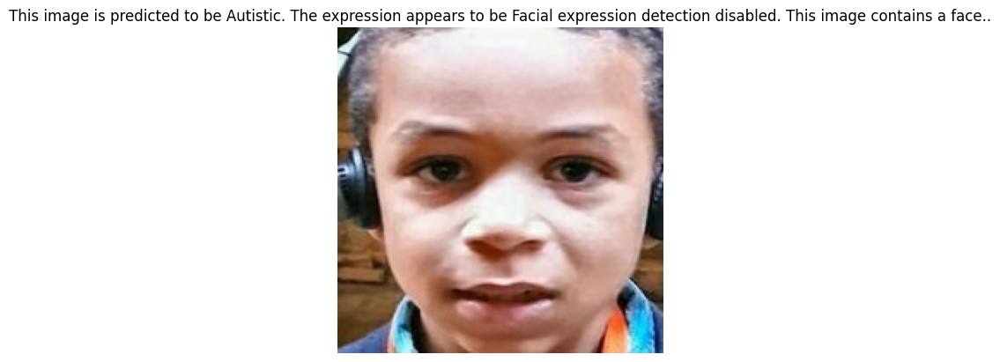

Image 2:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



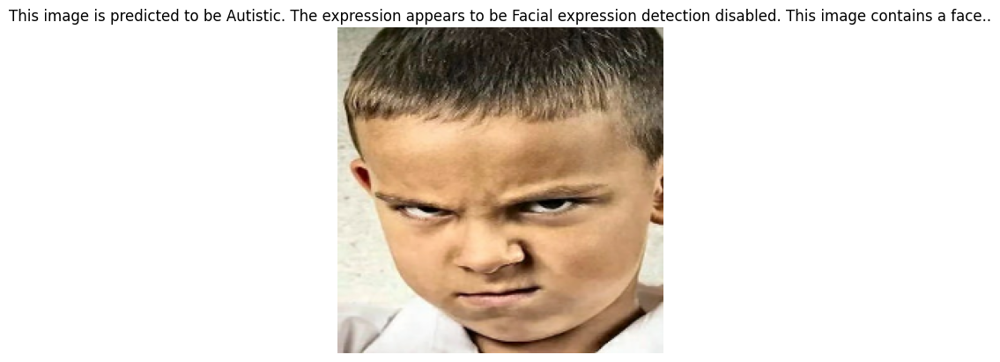

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



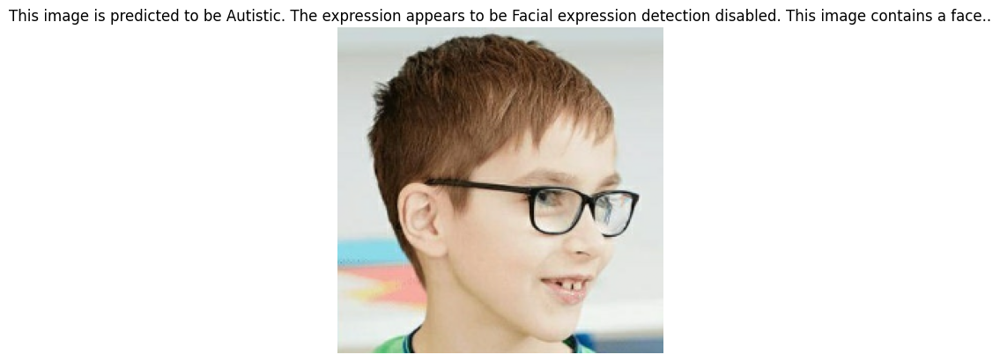

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



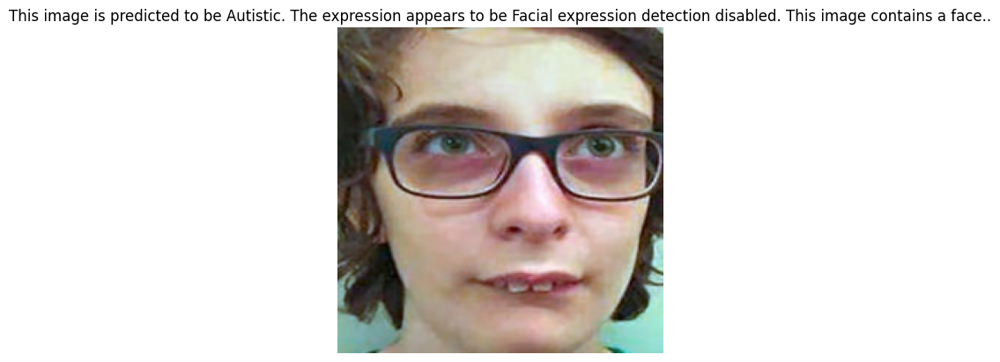

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
Image Descriptions:


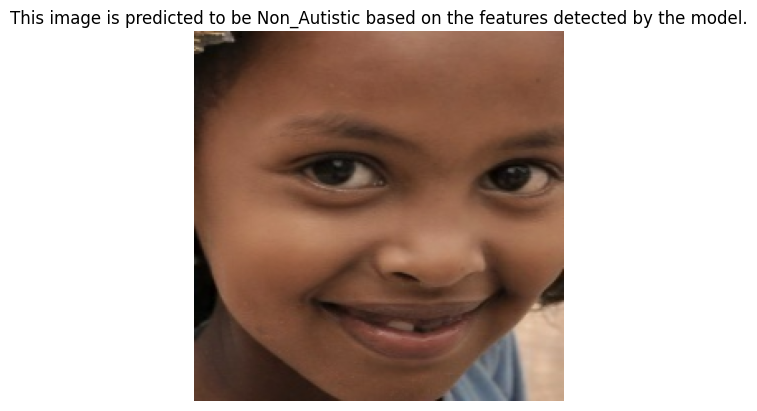

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



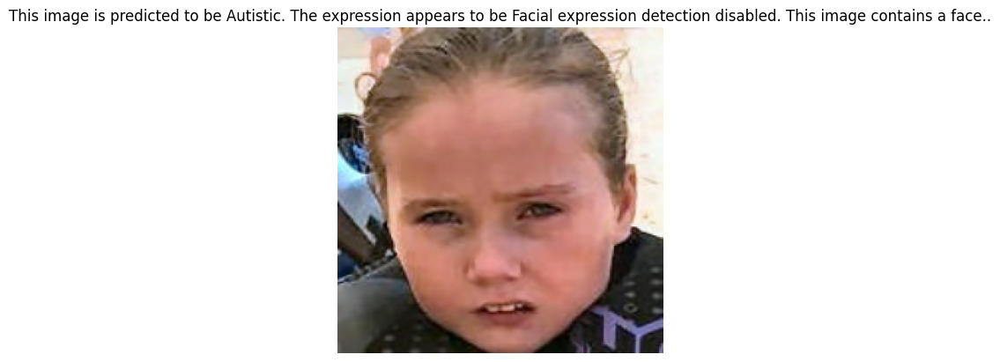

Image 2:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



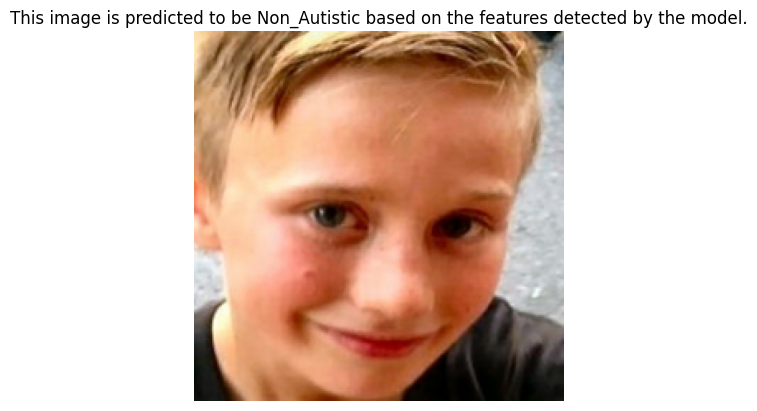

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



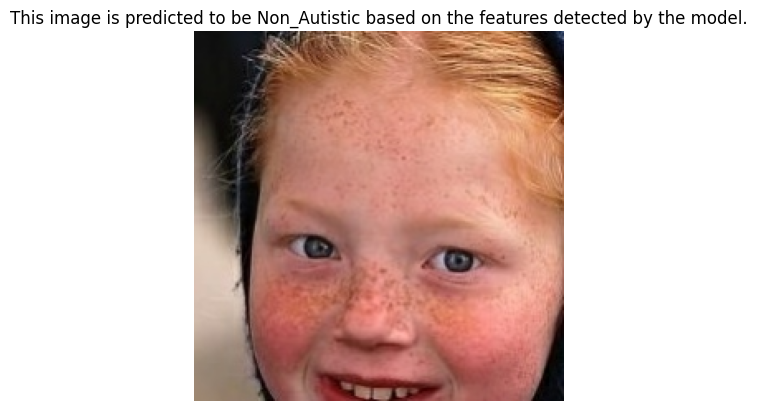

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



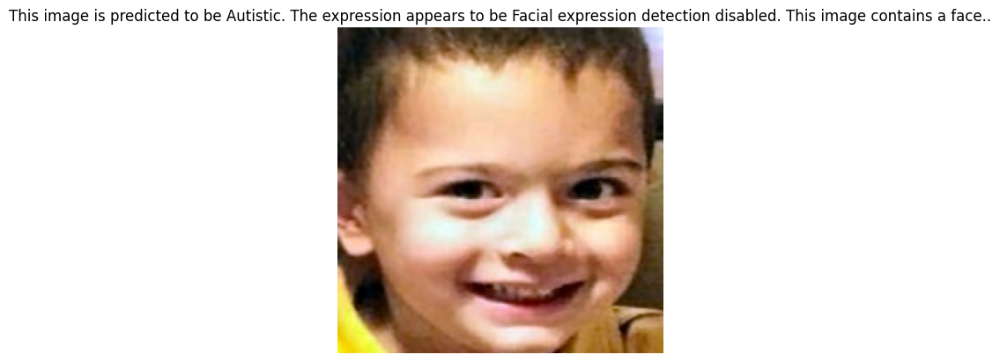

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

Overall Accuracy: 1.0
The overall accuracy is 100.00%.


In [ ]:
# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model2.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the image
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()

# Calculate overall accuracy
overall_accuracy = correct_predictions / (num_images * len(image_batch))
print("Overall Accuracy:", overall_accuracy)
print(f"The overall accuracy is {overall_accuracy:.2%}.")



In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

# Load the pre-trained EfficientNetB0 model without the top classification layer
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the pre-trained model
model3 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(class_count, activation='softmax')
])

# Compile the model
model3.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history3= model3.fit(train_data, validation_data=val_data, epochs=10)


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 224s 3s/step - accuracy: 0.7009 - loss: 0.5507 - val_accuracy: 0.7891 - val_loss: 0.4716
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 238s 3s/step - accuracy: 0.8041 - loss: 0.4130 - val_accuracy: 0.7959 - val_loss: 0.4175
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 203s 3s/step - accuracy: 0.8327 - loss: 0.3541 - val_accuracy: 0.8027 - val_loss: 0.4245
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 246s 3s/step - accuracy: 0.8667 - loss: 0.3107 - val_accuracy: 0.8027 - val_loss: 0.4220
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 205s 3s/step - accuracy: 0.8732 - loss: 0.2852 - val_accuracy: 0.7959 - val_loss: 0.4226
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.8893 - loss: 0.2519 - val_accuracy: 0.8061 - val_loss: 0.4367
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 206s 3s/step - accuracy: 0.9199 - loss: 0.2155 - val_accuracy: 0.8027 - val_loss: 0.4455
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 184s 2s/step - accurac

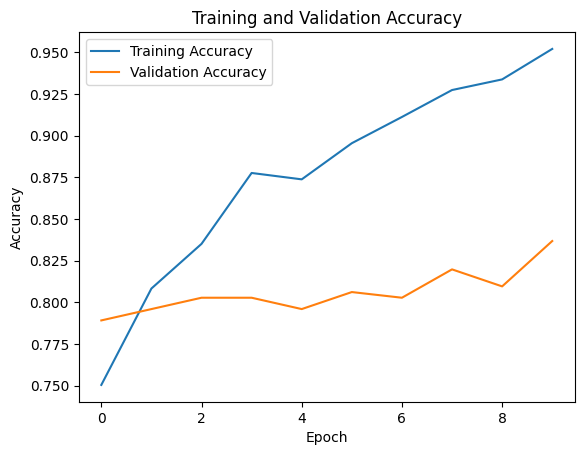

In [ ]:
# Plot training and validation accuracy
plt.plot(history3.history['accuracy'], label='Training Accuracy')
plt.plot(history3.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

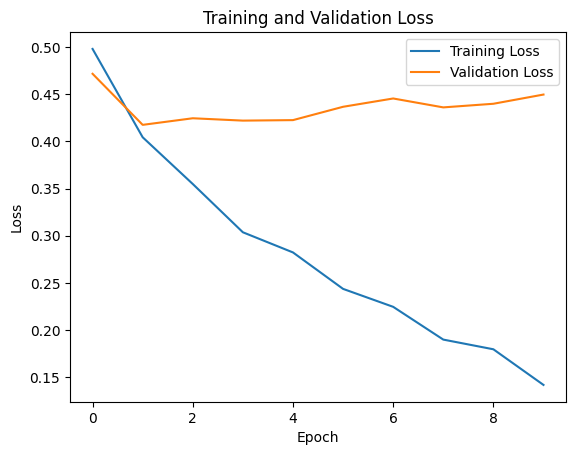

In [ ]:
# Plot training and validation loss
plt.plot(history3.history['loss'], label='Training Loss')
plt.plot(history3.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Classification Report:
              precision    recall  f1-score   support

Non-Autistic       0.81      0.88      0.84       147
    Autistic       0.87      0.80      0.83       147

    accuracy                           0.84       294
   macro avg       0.84      0.84      0.84       294
weighted avg       0.84      0.84      0.84       294



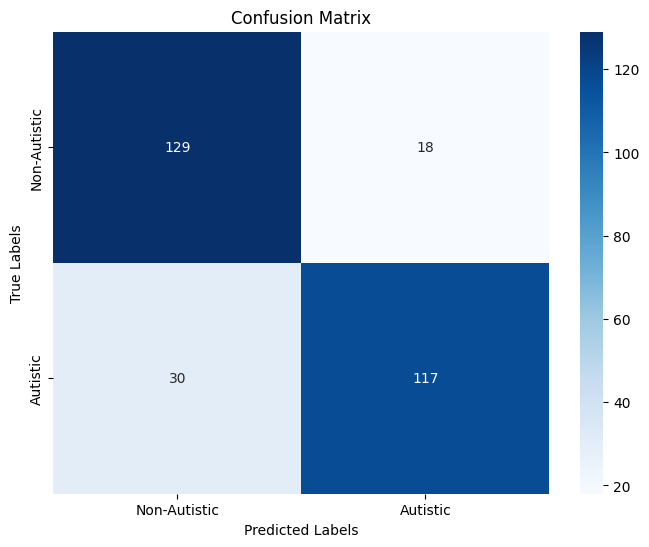

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define class labels for your dataset
class_labels = ["Non-Autistic", "Autistic"]  # Adjust according to your dataset

# Step 1: Get the true labels and predicted labels from the validation/test dataset
true_labels = []
predictions = []

# Iterate over the validation/test data to collect true labels and predictions
for images, labels in val_data:  # Change to test_data if you're using test data
    # Append true labels
    true_labels.extend(np.argmax(labels, axis=1))

    # Predict class probabilities and take the class with the highest probability
    preds = model3.predict(images)
    predictions.extend(np.argmax(preds, axis=1))

# Convert the lists to numpy arrays for further processing
true_labels = np.array(true_labels)
predictions = np.array(predictions)

# Step 2: Generate the classification report
print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=class_labels))

# Step 3: Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step
Image Descriptions:


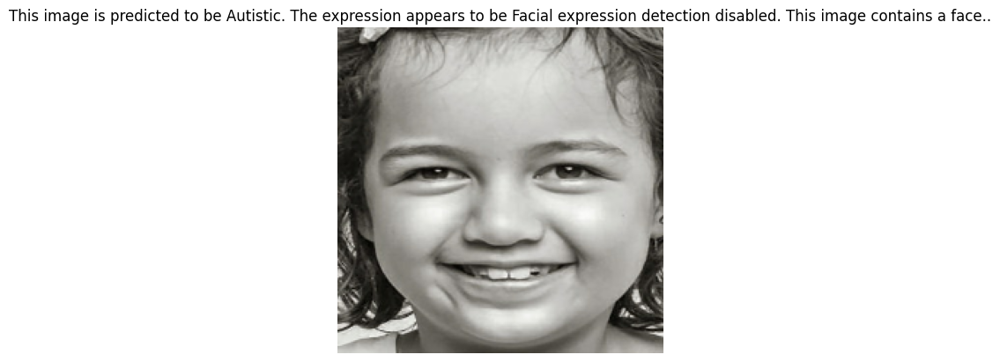

Image 1:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



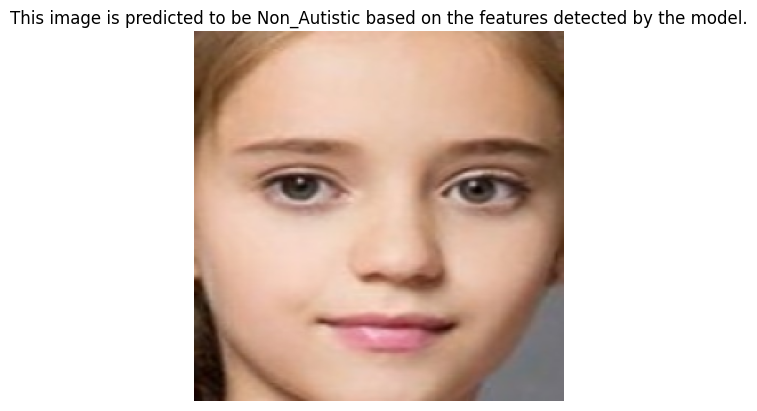

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



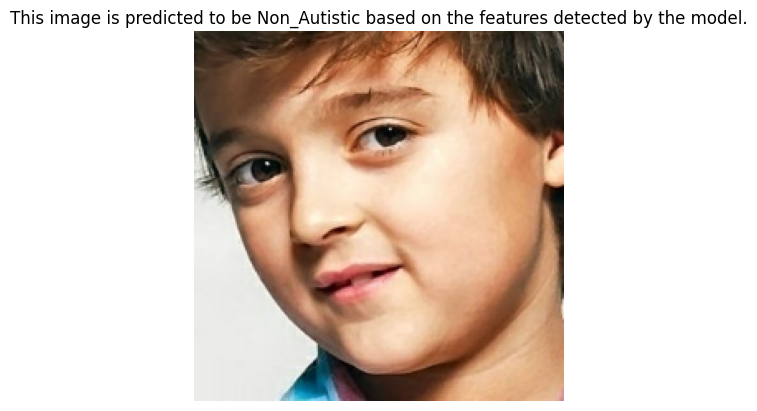

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



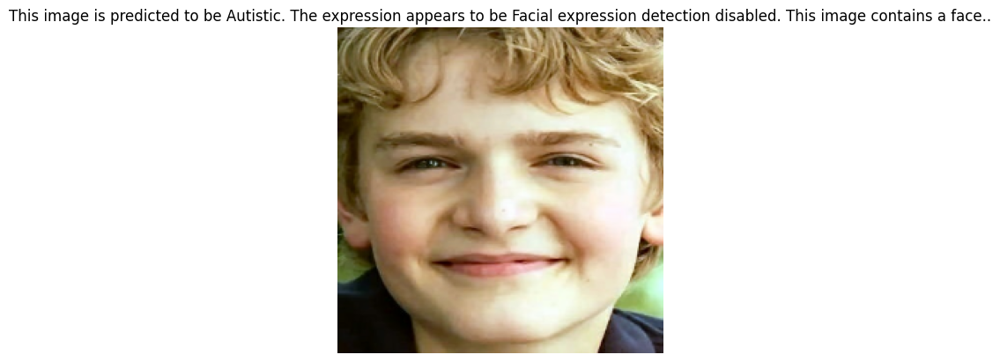

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



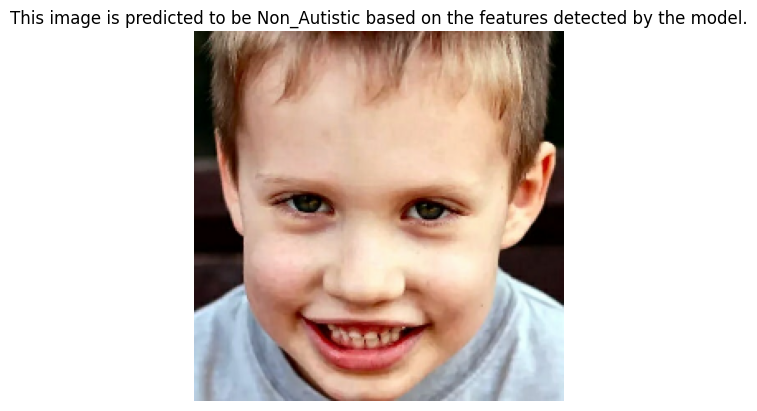

Image 5:
This image is predicted to be Non_Autistic based on the features detected by the model.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
Image Descriptions:


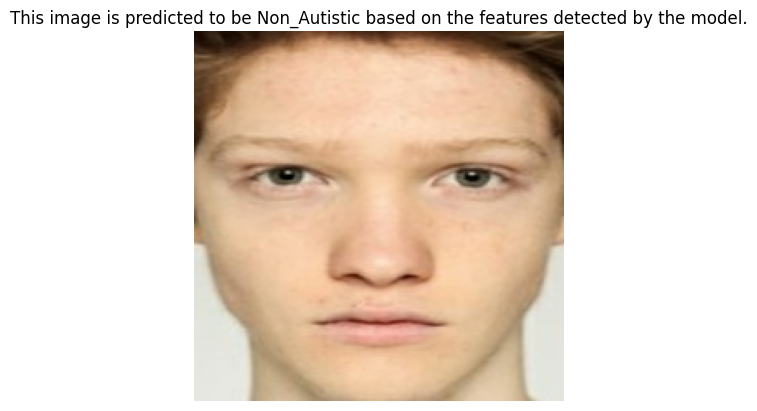

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



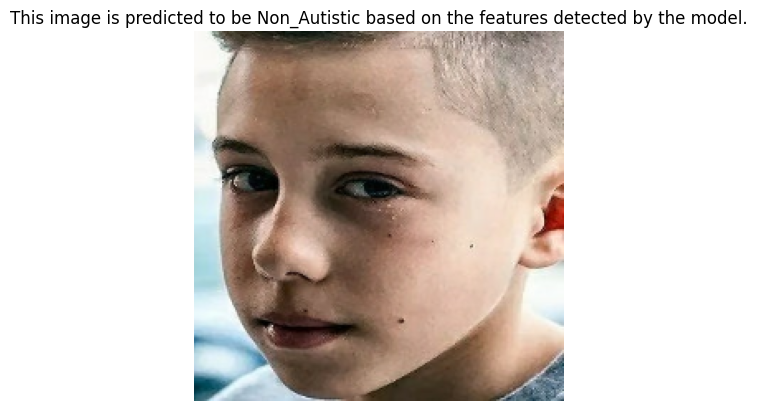

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



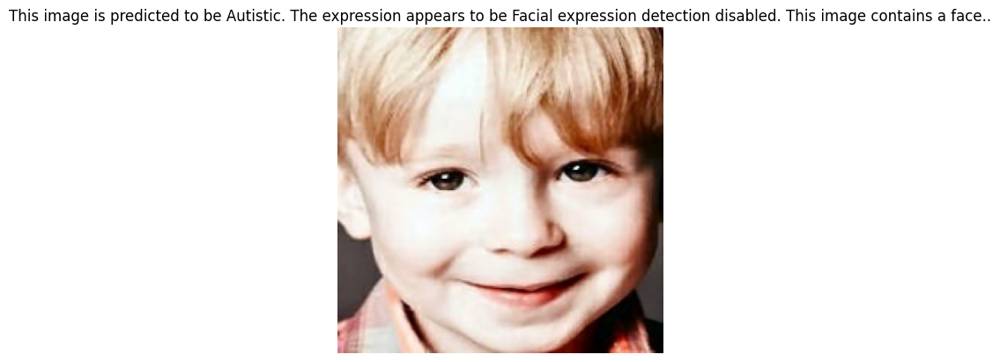

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



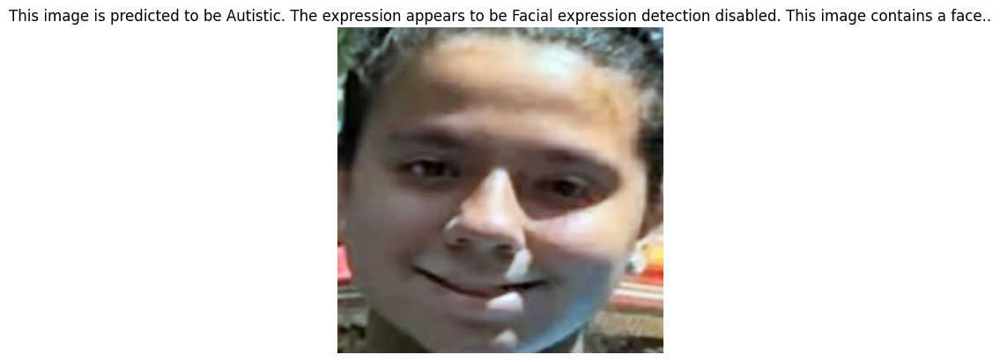

Image 4:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



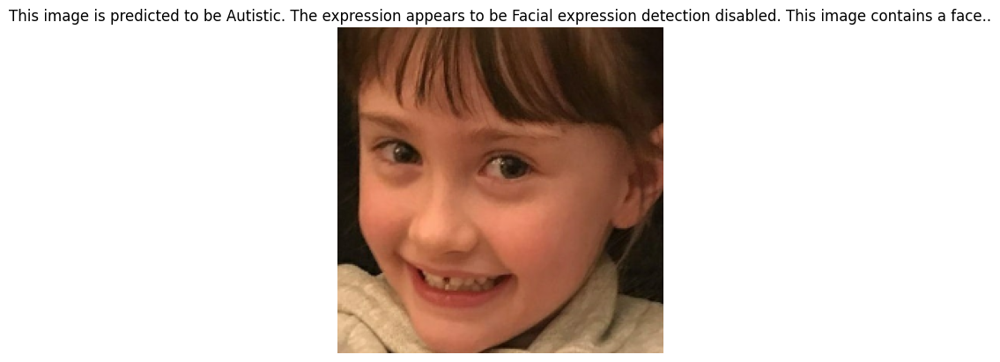

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



In [ ]:
# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model3.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the image
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()



In [ ]:


# Load the pre-trained ResNet50 model without the top classification layer
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top of the pre-trained model
model4= Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(class_count, activation='softmax')
])

# Compile the model
model4.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history4 = model4.fit(train_data, validation_data=val_data, epochs=10)


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 482s 6s/step - accuracy: 0.6302 - loss: 0.7962 - val_accuracy: 0.7823 - val_loss: 0.4658
Epoch 2/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 486s 6s/step - accuracy: 0.8103 - loss: 0.4053 - val_accuracy: 0.7687 - val_loss: 0.4526
Epoch 3/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 510s 6s/step - accuracy: 0.8185 - loss: 0.3820 - val_accuracy: 0.8163 - val_loss: 0.4045
Epoch 4/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 434s 6s/step - accuracy: 0.8364 - loss: 0.3633 - val_accuracy: 0.7993 - val_loss: 0.4316
Epoch 5/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 426s 6s/step - accuracy: 0.8692 - loss: 0.3163 - val_accuracy: 0.7925 - val_loss: 0.4023
Epoch 6/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 426s 6s/step - accuracy: 0.8690 - loss: 0.2936 - val_accuracy: 0.8129 - val_loss: 0.4023
Epoch 7/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 476s 6s/step - accuracy: 0.8973 - loss: 0.2517 - val_accuracy: 0.7823 - val_loss: 0.4314
Epoch 8/10
74/74 ━━━━━━━━━━━━━━━━━━━━ 465s 6s/step - accurac

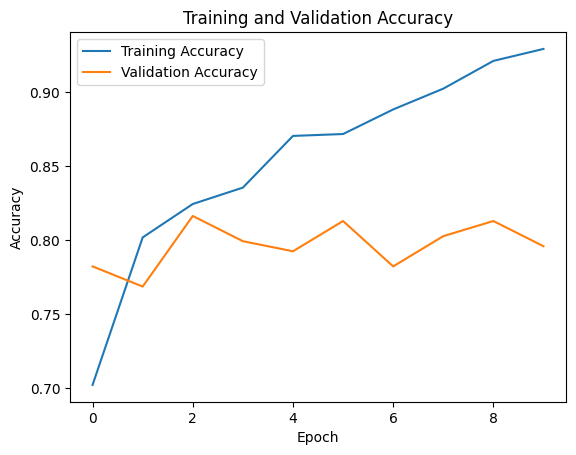

In [ ]:
# Plot training and validation accuracy
plt.plot(history4.history['accuracy'], label='Training Accuracy')
plt.plot(history4.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

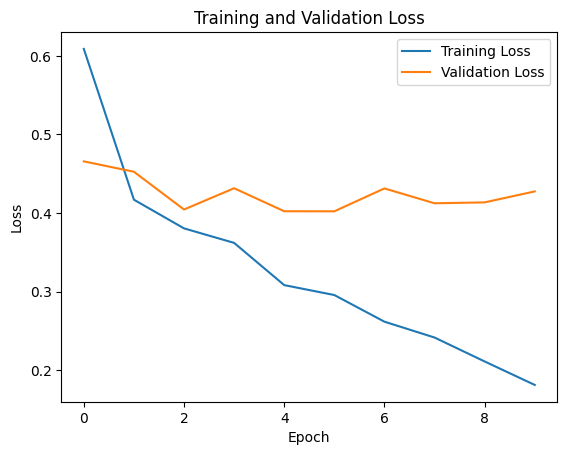

In [ ]:
# Plot training and validation loss
plt.plot(history4.history['loss'], label='Training Loss')
plt.plot(history4.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Classification Report:
              precision    recall  f1-score   support

Non-Autistic       0.78      0.83      0.80       147
    Autistic       0.82      0.76      0.79       147

    accuracy                           0.80       294
   macro avg       0.80      0.80      0.80       294
weighted avg       0.80      0.80      0.80       294



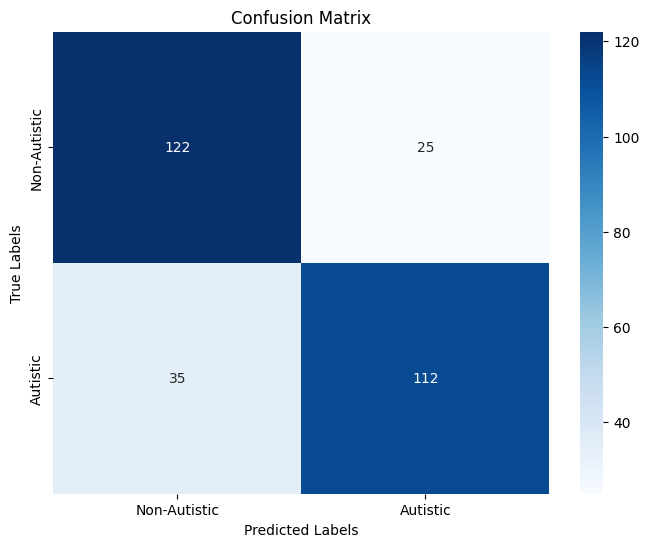

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define class labels for your dataset
class_labels = ["Non-Autistic", "Autistic"]  # Adjust according to your dataset

# Step 1: Get the true labels and predicted labels from the validation/test dataset
true_labels = []
predictions = []

# Iterate over the validation/test data to collect true labels and predictions
for images, labels in val_data:  # Change to test_data if you're using test data
    # Append true labels
    true_labels.extend(np.argmax(labels, axis=1))

    # Predict class probabilities and take the class with the highest probability
    preds = model4.predict(images)
    predictions.extend(np.argmax(preds, axis=1))

# Convert the lists to numpy arrays for further processing
true_labels = np.array(true_labels)
predictions = np.array(predictions)

# Step 2: Generate the classification report
print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=class_labels))

# Step 3: Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()


Found 294 files belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step
Image Descriptions:


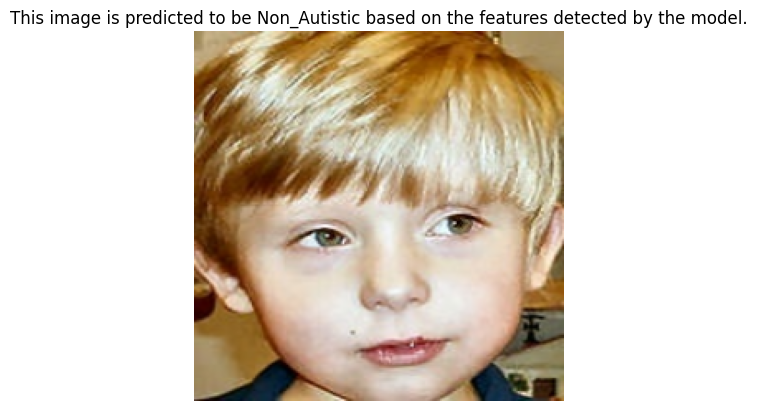

Image 1:
This image is predicted to be Non_Autistic based on the features detected by the model.



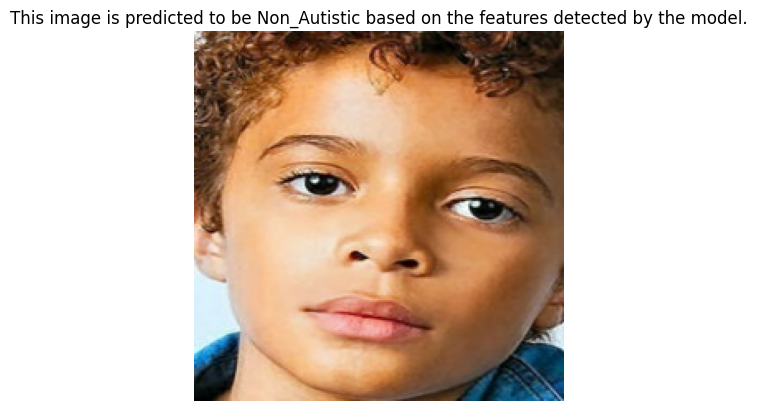

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



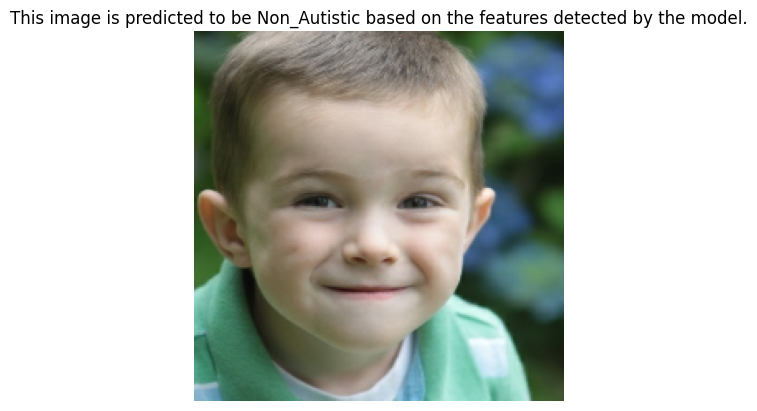

Image 3:
This image is predicted to be Non_Autistic based on the features detected by the model.



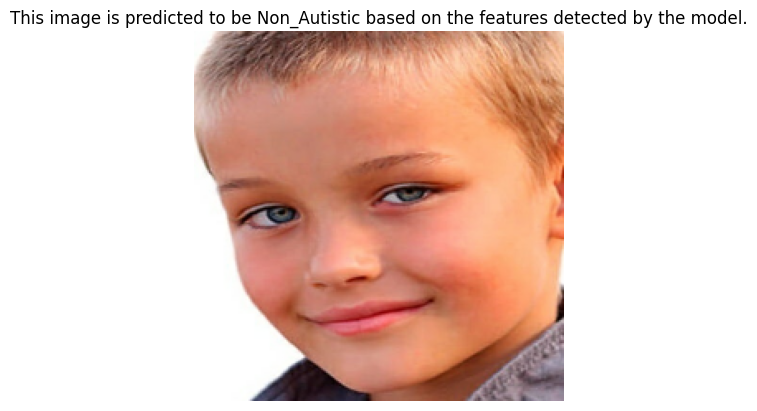

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



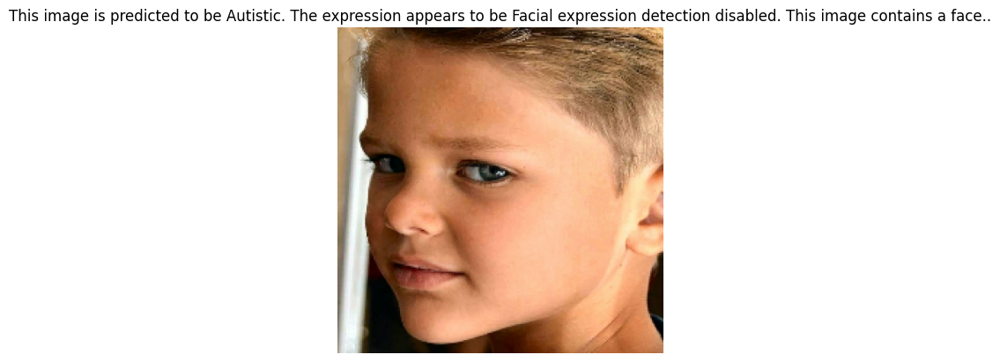

Image 5:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Image Descriptions:


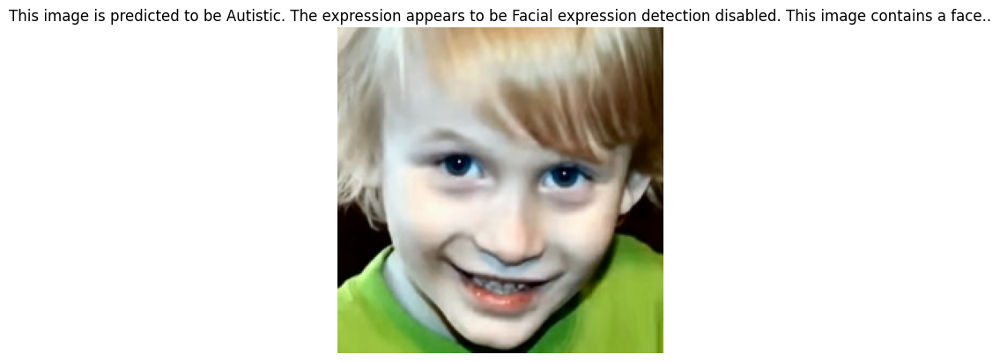

Image 1:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



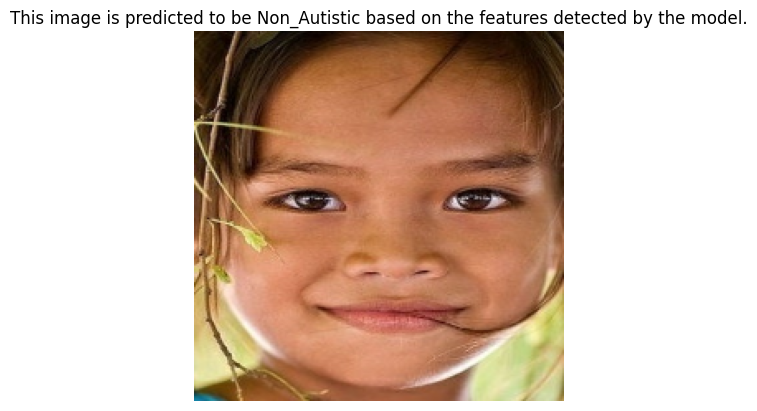

Image 2:
This image is predicted to be Non_Autistic based on the features detected by the model.



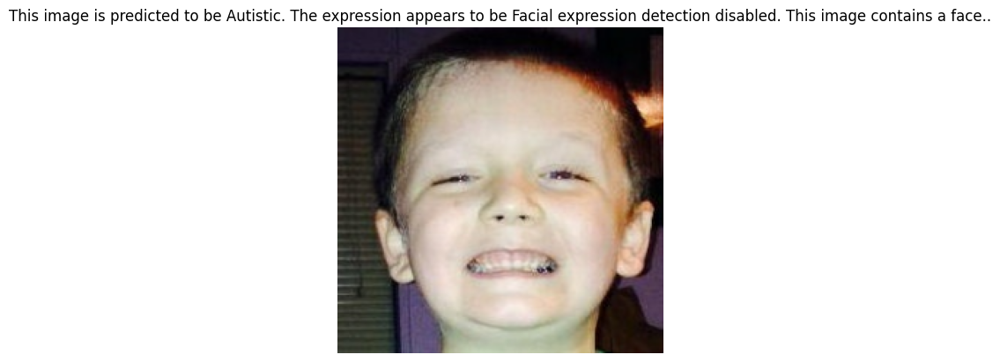

Image 3:
This image is predicted to be Autistic. The expression appears to be Facial expression detection disabled. This image contains a face..



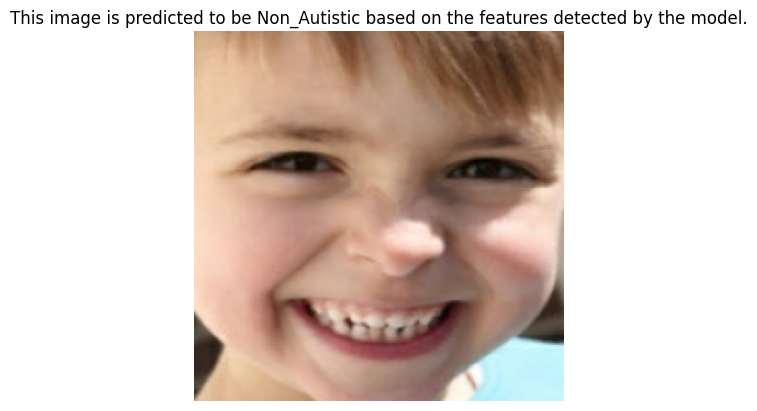

Image 4:
This image is predicted to be Non_Autistic based on the features detected by the model.



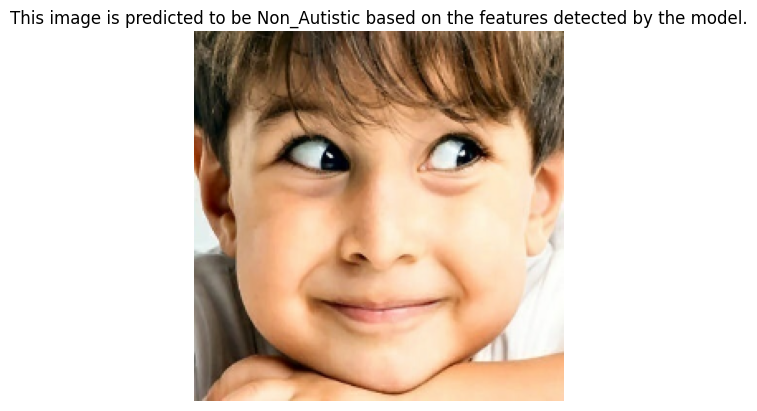

Image 5:
This image is predicted to be Non_Autistic based on the features detected by the model.



In [ ]:
# Function to detect facial expression in an image
def detect_expression(image):
    return "Facial expression detection disabled. This image contains a face."

# Reset test_data generator to ensure we start from the beginning
test_data = image_dataset_from_directory(test_dir, batch_size=5, image_size=(224,224),
                                         label_mode='categorical', shuffle=True, seed=42)

# Number of random images to evaluate
num_images = 2

# Initialize a variable to count correct predictions
correct_predictions = 0

# Randomly select num_images individual images from the entire dataset
random_images = random.sample(list(test_data.as_numpy_iterator()), num_images)

# Initialize a list to store descriptions for each image
image_descriptions = []

for i, (image_batch, label_batch) in enumerate(random_images):
    # Predict class labels for the image batch
    predictions = model4.predict(image_batch)

    # Show images and display accuracy
    print("Image Descriptions:")
    for j in range(len(image_batch)):
        true_label = class_names[tf.argmax(label_batch[j])]
        predicted_label = class_names[tf.argmax(predictions[j])]

        # Check if the prediction is correct
        is_correct = true_label == predicted_label
        if is_correct:
            correct_predictions += 1

        # Generate a description for the image
        if predicted_label == 'Autistic':
            expression = detect_expression(image_batch[j])
            if expression:
                description = f"This image is predicted to be {predicted_label}. The expression appears to be {expression}."
            else:
                description = f"This image is predicted to be {predicted_label}. Facial expression detection is disabled."
        else:
            description = f"This image is predicted to be {predicted_label} based on the features detected by the model."

        image_descriptions.append(description)

        # Display the
        plt.imshow(image_batch[j]/255.)
        plt.axis("off")
        plt.title(description)
        plt.show()

        # Print the description
        print(f"Image {j+1}:")
        print(description)
        print()





testing all the model

In [ ]:
# Evaluate each model on the validation set and store the results
evaluation_results = {}

# Models to evaluate
models = [model,model2, model3, model4]
model_names = ['cnn','MobileNetV2', 'EfficientNetB0', 'ResNet50']

for name, model in zip(model_names, models):
    loss, accuracy = model.evaluate(val_data)
    evaluation_results[name] = (loss, accuracy)

# Find the best model based on validation accuracy
best_model_name = max(evaluation_results, key=lambda k: evaluation_results[k][1])
best_model_evaluation_result = evaluation_results[best_model_name]

print(f'Best Model: {best_model_name}')
print(f'Validation Accuracy: {best_model_evaluation_result[1]}')

# Print evaluation results for all models
for name, result in evaluation_results.items():
    print(f'Model: {name}, Validation Loss: {result[0]}, Validation Accuracy: {result[1]}')



10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 358ms/step - accuracy: 0.7659 - loss: 0.6924
10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.7019 - loss: 0.6402
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.8543 - loss: 0.4157
10/10 ━━━━━━━━━━━━━━━━━━━━ 48s 5s/step - accuracy: 0.7961 - loss: 0.4235
Best Model: EfficientNetB0
Validation Accuracy: 0.8367347121238708
Model: cnn, Validation Loss: 0.6931482553482056, Validation Accuracy: 0.5
Model: MobileNetV2, Validation Loss: 0.5614330768585205, Validation Accuracy: 0.7312925457954407
Model: EfficientNetB0, Validation Loss: 0.4496486485004425, Validation Accuracy: 0.8367347121238708
Model: ResNet50, Validation Loss: 0.427554190158844, Validation Accuracy: 0.795918345451355
